In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split

import shap
import lime
import lime.lime_tabular

c:\Users\nicholaschen\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
def showFeatureDetail(dataset, featureName):
  featureList = list(dataset.columns)
  print('No. Feature: ', featureList.index(featureName) + 1)
  print('Feature Name: ', featureName)

  print('Total Unique Value: ', dataset[featureName].value_counts(dropna=False).index.size, end=' ')
  if (dataset[featureName].value_counts(dropna=False).index.size == 1): print('(single-value)')
  elif (dataset[featureName].value_counts(dropna=False).index.size == len(dataset.index)): print('(all-unique-value)')
  else: print('')
  
  print('Value Type: ', dataset.dtypes[featureName])
  print('Description: ')
  print('')
  print('Total each value:')
  print(dataset[featureName].value_counts(dropna=False))

<span style="font-weight:700;font-size:36px">
  Dataset Detail
</span>

In [3]:
# Load Dataset
APADDoSDataset = pd.read_csv("./data/ionosphere_csv.csv")
APADDoSDataset.head()

,a01,a02,a03,a04,a05,a06,a07,a08,a09,a10,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,0,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,0,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,0,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,0,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g


In [4]:
print('Dataset Name: APADDoSDataset')
print('Total Feature: ', APADDoSDataset.columns.size)
print('')
print('Feature List: ')
APADDoSDataset.dtypes

Dataset Name: APADDoSDataset
Total Feature:  35

Feature List: 


a01        int64
a02        int64
a03      float64
a04      float64
a05      float64
a06      float64
a07      float64
a08      float64
a09      float64
a10      float64
a11      float64
a12      float64
a13      float64
a14      float64
a15      float64
a16      float64
a17      float64
a18      float64
a19      float64
a20      float64
a21      float64
a22      float64
a23      float64
a24      float64
a25      float64
a26      float64
a27      float64
a28      float64
a29      float64
a30      float64
a31      float64
a32      float64
a33      float64
a34      float64
class     object
dtype: object

<span style="font-weight:500;font-size:24px">
  Total unique value in each feature
</span>

In [5]:
for featureName in APADDoSDataset.columns:
  print(f'{featureName}\t\t: {APADDoSDataset[featureName].value_counts(dropna=False).index.size}', end=' ')
  if (APADDoSDataset[featureName].value_counts(dropna=False).index.size == 1): print('(single-value)')
  elif (APADDoSDataset[featureName].value_counts(dropna=False).index.size == len(APADDoSDataset.index)): print('(all-unique-value)')
  else: print('')
  # print(f'{APADDoSDataset[featureName].value_counts(dropna=False)}')
  # print('==============================================')

a01		: 2 
a02		: 1 (single-value)
a03		: 219 
a04		: 269 
a05		: 204 
a06		: 259 
a07		: 231 
a08		: 260 
a09		: 244 
a10		: 267 
a11		: 246 
a12		: 269 
a13		: 238 
a14		: 266 
a15		: 234 
a16		: 270 
a17		: 254 
a18		: 280 
a19		: 254 
a20		: 266 
a21		: 248 
a22		: 265 
a23		: 248 
a24		: 264 
a25		: 256 
a26		: 273 
a27		: 256 
a28		: 281 
a29		: 244 
a30		: 266 
a31		: 243 
a32		: 263 
a33		: 245 
a34		: 263 
class		: 2 


<span style="font-weight:700;font-size:36px">
  Preprocessing
</span><br/>

<span style="font-weight:500;font-size:24px">
  Feature selection
</span><br/>
<span style="font-weight:300;font-size:20px">
  remove all feature that single-value and all-unique-value, feature selection: feature gain, dkk (note: ada libnya)
</span>

In [6]:
removedFeature = []
dfRemovedFeature = APADDoSDataset.copy()

for featureName in APADDoSDataset.columns:
  if (
    APADDoSDataset[featureName].value_counts(dropna=False).index.size == 1
    or APADDoSDataset[featureName].value_counts(dropna=False).index.size == len(APADDoSDataset.index)
  ): removedFeature.append(featureName)

dfRemovedFeature = dfRemovedFeature.drop(removedFeature, axis=1)
dfRemovedFeature

,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,g
347,1,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,g
348,1,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,g
349,1,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,g


<span style="font-weight:500;font-size:24px">
  Label Reduction
</span><br/>
<span style="font-weight:300;font-size:20px">
  make label value into binary: 'benign' or 'malignant'
</span>

In [8]:
dfLabelReducted = dfRemovedFeature.copy()

dfLabelReducted

,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,g
347,1,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,g
348,1,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,g
349,1,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,g


<span style="font-weight:500;font-size:24px">
  One-hot Encoding
</span><br/>
<span style="font-weight:300;font-size:20px">
  encode 'ip.src' using one-hot encoding
</span>

In [9]:
dfOnehotEncoded = dfLabelReducted.copy()

dfOnehotEncoded

,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,g
347,1,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,g
348,1,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,g
349,1,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,g


<span style="font-weight:500;font-size:24px">
  Check Duplicate in row
</span><br/>

In [12]:
dups = dfOnehotEncoded.duplicated()
# report if there are any duplicates
print(dups.any())
# list all duplicate rows
print(dfOnehotEncoded[dups])

dfDupsRemoved = dfOnehotEncoded.drop_duplicates(keep='first')
dfDupsRemoved

True
     a01  a03  a04  a05  a06  a07  a08  a09  a10  a11  ...  a26  a27  a28  \
248    0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.0  1.0 -1.0   

     a29  a30  a31  a32  a33  a34  class  
248  0.0  0.0  0.0  0.0  0.0  0.0      b  

[1 rows x 34 columns]


,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,g
347,1,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,g
348,1,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,g
349,1,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,g


<span style="font-weight:500;font-size:24px">
  Label Encoding
</span><br/>
<span style="font-weight:300;font-size:20px">
  encode 'tcp.srcport' and 'Label' using label encoding
</span>

In [15]:
dfLabelEncoded = dfDupsRemoved.copy()
label_encoder = LabelEncoder()

# dfLabelEncoded['tcp.srcport'] = label_encoder.fit_transform(dfLabelEncoded['tcp.srcport'])
dfLabelEncoded['class'] = label_encoder.fit_transform(dfLabelEncoded['class'])

print(dfDupsRemoved['class'].unique())
print(dfLabelEncoded['class'].unique())

# move 'Label' column to the last column
column_to_move = dfLabelEncoded.pop("class")
dfLabelEncoded.insert(dfLabelEncoded.columns.size, "class", column_to_move)

dfLabelEncoded

['g' 'b']
[1 0]


,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a26,a27,a28,a29,a30,a31,a32,a33,a34,class
0,1,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,1
1,1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,0
2,1,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,1
3,1,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,0
4,1,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,1
347,1,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,1
348,1,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,1
349,1,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,1


<span style="font-weight:500;font-size:24px">
  Data Standardisation
</span><br/>
<span style="font-weight:300;font-size:20px">
  standardize all feature range to 0-1
</span>

In [17]:
dfStandarded = dfLabelEncoded.copy()

dfStandardedWithoutLabel = dfStandarded.loc[:, dfLabelEncoded.columns != 'class']
dfStandardedLabel = dfStandarded.loc[:, dfLabelEncoded.columns == 'class']

# standardizing process start here
arrayStandardedWithoutLabel = dfStandardedWithoutLabel.to_numpy()

scaler = MinMaxScaler()
arrayStandardedWithoutLabel = scaler.fit_transform(arrayStandardedWithoutLabel)

dfStandardedWithoutLabel = pd.DataFrame(arrayStandardedWithoutLabel, columns = dfStandardedWithoutLabel.columns)
dfStandardedWithoutLabel

,a01,a03,a04,a05,a06,a07,a08,a09,a10,a11,...,a25,a26,a27,a28,a29,a30,a31,a32,a33,a34
0,1.0,0.997695,0.470555,0.926215,0.511530,0.916990,0.311460,1.000000,0.518800,0.926215,...,0.784055,0.244145,0.705390,0.269160,0.606330,0.329550,0.711335,0.227565,0.593205,0.273500
1,1.0,1.000000,0.405855,0.965175,0.319220,0.445660,0.032015,1.000000,0.477255,0.754370,...,0.398340,0.367155,0.397660,0.407995,0.404800,0.442035,0.416870,0.468560,0.431310,0.487765
2,1.0,1.000000,0.483175,1.000000,0.502425,1.000000,0.439690,0.944825,0.505990,0.865410,...,0.787640,0.298900,0.794920,0.389275,0.715500,0.413175,0.802180,0.379100,0.780225,0.308810
3,1.0,1.000000,0.274195,1.000000,1.000000,0.856080,0.000000,0.500000,0.500000,0.500000,...,1.000000,0.953475,0.758065,1.000000,1.000000,0.399505,0.628410,1.000000,0.338090,1.000000
4,1.0,1.000000,0.487995,0.970700,0.532655,0.960530,0.383725,0.885760,0.418005,0.763990,...,0.516430,0.174210,0.566450,0.233970,0.512155,0.189015,0.471465,0.202135,0.476960,0.171515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,1.0,0.917540,0.541490,0.868695,0.426470,0.921745,0.472165,0.952205,0.476890,0.946955,...,0.976890,0.478990,0.917395,0.500615,1.000000,0.564075,0.933300,0.446430,0.952730,0.478465
346,1.0,0.975565,0.502095,0.975915,0.486385,0.967190,0.490400,0.972950,0.508030,0.982550,...,0.972600,0.506805,0.967610,0.524625,0.965795,0.540840,0.970330,0.499825,0.957415,0.523560
347,1.0,0.973505,0.499830,0.966035,0.483865,0.975885,0.482845,0.977920,0.512230,0.970620,...,0.969940,0.515965,0.962445,0.512710,0.960600,0.511210,0.962295,0.502210,0.963485,0.497115
348,1.0,0.953040,0.491715,0.990610,0.490055,0.978455,0.481770,0.928730,0.500550,0.948620,...,0.955250,0.489505,0.945735,0.461200,0.914915,0.413810,0.980110,0.481215,0.937015,0.418785


<span style="font-weight:500;font-size:24px">
  Correlation Check
</span><br/>
<span style="font-weight:300;font-size:20px">
  Feature selection via high correlation features
</span>

['a04', 'a06', 'a08', 'a10', 'a11', 'a12', 'a14', 'a16', 'a17', 'a18', 'a19', 'a20', 'a22', 'a24', 'a25', 'a26', 'a27', 'a28', 'a30', 'a32', 'a34']
     a01       a03       a05       a07       a09       a13       a21  \
0    1.0  0.997695  0.926215  0.916990  1.000000  0.798775  0.784855   
1    1.0  1.000000  0.965175  0.445660  1.000000  0.672160  0.434245   
2    1.0  1.000000  1.000000  1.000000  0.944825  0.927215  0.854435   
3    1.0  1.000000  1.000000  0.856080  0.500000  0.500000  0.150125   
4    1.0  1.000000  0.970700  0.960530  0.885760  0.782045  0.529910   
..   ...       ...       ...       ...       ...       ...       ...   
345  1.0  0.917540  0.868695  0.921745  0.952205  0.905985  0.938025   
346  1.0  0.975565  0.975915  0.967190  0.972950  0.970855  0.963350   
347  1.0  0.973505  0.966035  0.975885  0.977920  0.962975  0.957030   
348  1.0  0.953040  0.990610  0.978455  0.928730  0.945305  0.943645   
349  1.0  0.923550  0.868190  0.939365  0.944640  0.903340  

Text(0.5, 1.0, 'Correlation Heatmap')

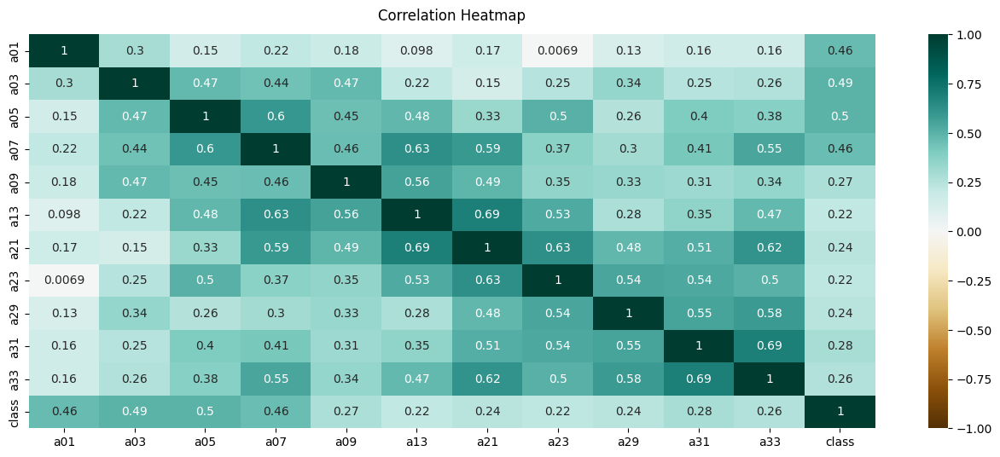

In [44]:
dfAll = dfStandardedWithoutLabel.copy()
dfAll.insert(dfAll.columns.size, "class", dfStandardedLabel)

corr_matrix = dfAll.corr()
series_class = pd.Series(corr_matrix['class'])
# print(series_class)
new_series = series_class.loc[lambda x : x < 0.2]
print(new_series.index.to_list())

dfNew = dfAll.drop(new_series.index.to_list(), axis=1)
print(dfNew)
new_corr_matrix = dfNew.corr()
print(new_corr_matrix)

# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(new_corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [45]:
correlated_features = set()

for i in range(len(new_corr_matrix.columns)):
  for j in range(i):
    if abs(new_corr_matrix.iloc[i, j]) > 0.8:
      colname = new_corr_matrix.columns[i]
      correlated_features.add(colname)

print(len(correlated_features))
print(correlated_features)

0
set()


In [46]:
dfNew.drop(labels=correlated_features, axis=1, inplace=True)

Text(0.5, 1.0, 'Correlation Heatmap')

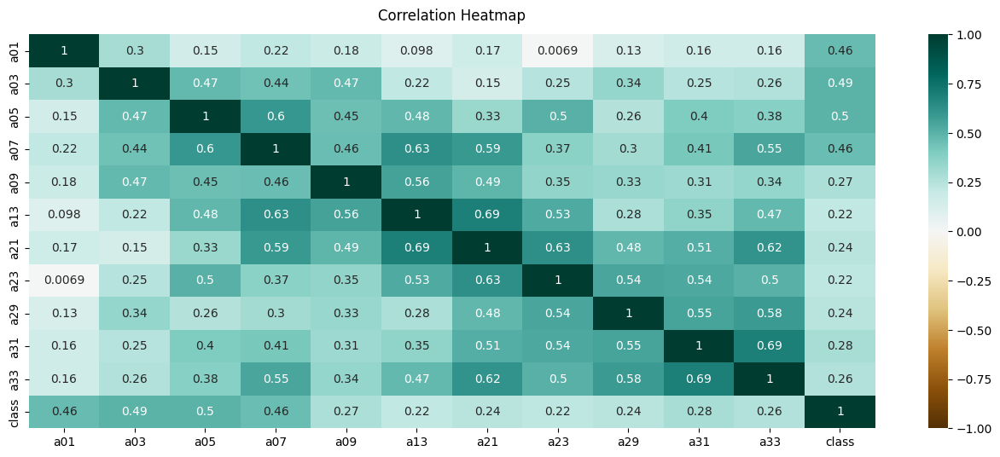

In [49]:
corr_matrix = dfNew.corr()

# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [58]:
# dfPreprocessed = dfStandardedWithoutLabel.copy()


# dfPreprocessed.insert(dfPreprocessed.columns.size, "class", dfStandardedLabel)

# # Seperate df by Label value
# # Malignant === 1 in label column
# dfMalignant = dfPreprocessed[dfPreprocessed["class"] == 1]
# dfBenign = dfPreprocessed[dfPreprocessed["class"] == 0]

# # sample each df by 200 randomly
# dfSampledMalignant = dfMalignant.sample(n=200, random_state=42)
# dfSampledBenign = dfBenign.sample(n=200, random_state=42)

# # join all df to make dfSampled
# frame = [dfSampledMalignant, dfSampledBenign]
# dfSampled = pd.concat(frame, copy=True)
print(dfNew['class'].isnull().values.any())
dfNew = dfNew.dropna(axis=0)
print(dfNew['class'].isnull().values.any())

# # Seperate dfSample to X and y
dfSampledWithoutLabel = dfNew.loc[:, dfNew.columns != 'class']
dfSampledLabel = dfNew.loc[:, dfNew.columns == 'class']

dfSampledWithoutLabel

True
False


,a01,a03,a05,a07,a09,a13,a21,a23,a29,a31,a33
0,1.0,0.997695,0.926215,0.916990,1.000000,0.798775,0.784855,0.684730,0.606330,0.711335,0.593205
1,1.0,1.000000,0.965175,0.445660,1.000000,0.672160,0.434245,0.409720,0.404800,0.416870,0.431310
2,1.0,1.000000,1.000000,1.000000,0.944825,0.927215,0.854435,0.716925,0.715500,0.802180,0.780225
3,1.0,1.000000,1.000000,0.856080,0.500000,0.500000,0.150125,0.500000,1.000000,0.628410,0.338090
4,1.0,1.000000,0.970700,0.960530,0.885760,0.782045,0.529910,0.511545,0.512155,0.471465,0.476960
...,...,...,...,...,...,...,...,...,...,...,...
345,1.0,0.917540,0.868695,0.921745,0.952205,0.905985,0.938025,0.887605,1.000000,0.933300,0.952730
346,1.0,0.975565,0.975915,0.967190,0.972950,0.970855,0.963350,0.965620,0.965795,0.970330,0.957415
347,1.0,0.973505,0.966035,0.975885,0.977920,0.962975,0.957030,0.947350,0.960600,0.962295,0.963485
348,1.0,0.953040,0.990610,0.978455,0.928730,0.945305,0.943645,0.960775,0.914915,0.980110,0.937015


<span style="font-weight:500;font-size:24px">
  KNN
</span><br/>

y_test [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1.
 0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
sklearn KNN
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Score: 0.8285714285714286
Accuracy: 0.8285714285714286


100%|██████████| 70/70 [00:09<00:00,  7.68it/s]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


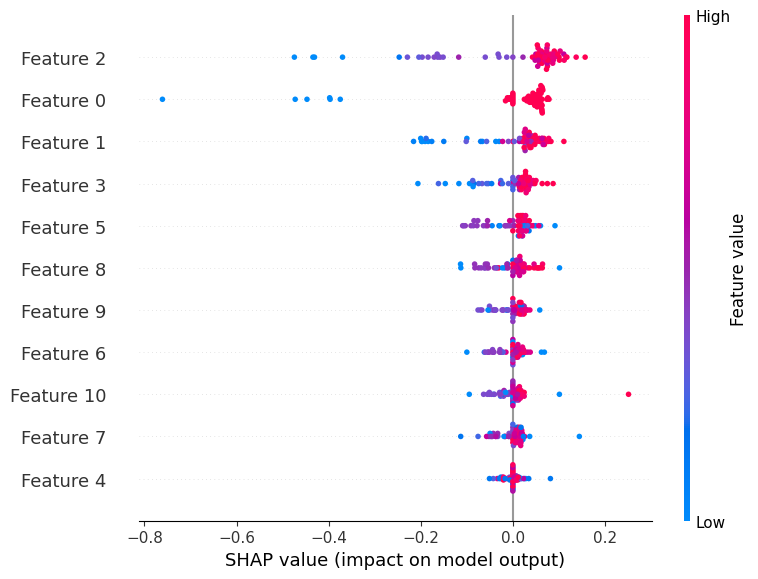

Intercept 0.6716534683063269
Prediction_local [0.92044682]
Right: 0.8571428571428571


In [59]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

k = 7
k_range = np.arange(1, 12)
X = dfSampledWithoutLabel.to_numpy()
y = np.squeeze(dfSampledLabel.to_numpy())

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

print('y_test', y_test)

# sklearn KNN
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train, y_train)
print("sklearn KNN")
y_pred = knn.predict(X_test)
print(y_pred)
print("Score: " + str(knn.score(X_test, y_test)))

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(knn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
# shap.force_plot(svc_shap_values, numpy.array(X_test))
# shap.force_plot(explainer.expected_value, svc_shap_values)
shap.summary_plot(svc_shap_values, np.array(X_test))

# LIME has one explainer for all the models
limeExplainer = lime.lime_tabular.LimeTabularExplainer(
  np.array(X_train), 
  # feature_names=X_train.columns.values.tolist(),
  # class_names=['MEDV'],
  verbose=True, 
  mode='classification'
)

exp = limeExplainer.explain_instance(np.array(X_test)[5], knn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

<span style="font-weight:500;font-size:24px">
  my KNN
</span><br/>


my KNN
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
0.8285714285714285


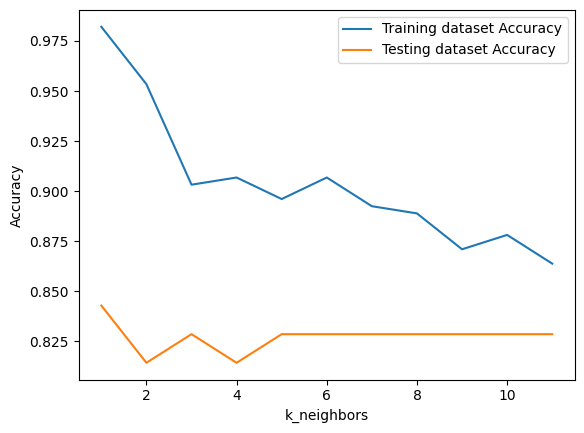

[[0.14285714 0.85714286]
 [0.14285714 0.85714286]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.14285714 0.85714286]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.14285714 0.85714286]
 [0.85714286 0.14285714]
 [0.14285714 0.85714286]
 [1.         0.        ]
 [0.         1.        ]
 [0.28571429 0.71428571]
 [0.14285714 0.85714286]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [1.         0.        ]
 [0.14285714 0.85714286]
 [1.         0.        ]
 [1.         0.        ]
 [0.14285714 0.85714286]
 [0.         1.        ]
 [0.28571429 0.71428571]
 [0.85714286 0.14285714]
 [1.         0.        ]
 [1.         0.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.14285714 0.85714286]
 [0.71428571 0.28571429]
 [1.         0.        ]
 [0.         1.        ]
 [0.28571429 0.71428571]
 [1.         0.        ]
 [0.         1.        ]


In [63]:
from KNN import KNN

# my KNN
myknn = KNN(k_neighbors=k)
myknn.fit(X_train, y_train)
print()
print("my KNN")
print(myknn.predict(X_test))
print(myknn.score(X_test, y_test))
myknn.showScoreInGraph(k_range, X_test, y_test)
print(myknn.predict_proba(np.array(X_test)))

100%|██████████| 80/80 [15:56<00:00, 11.95s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


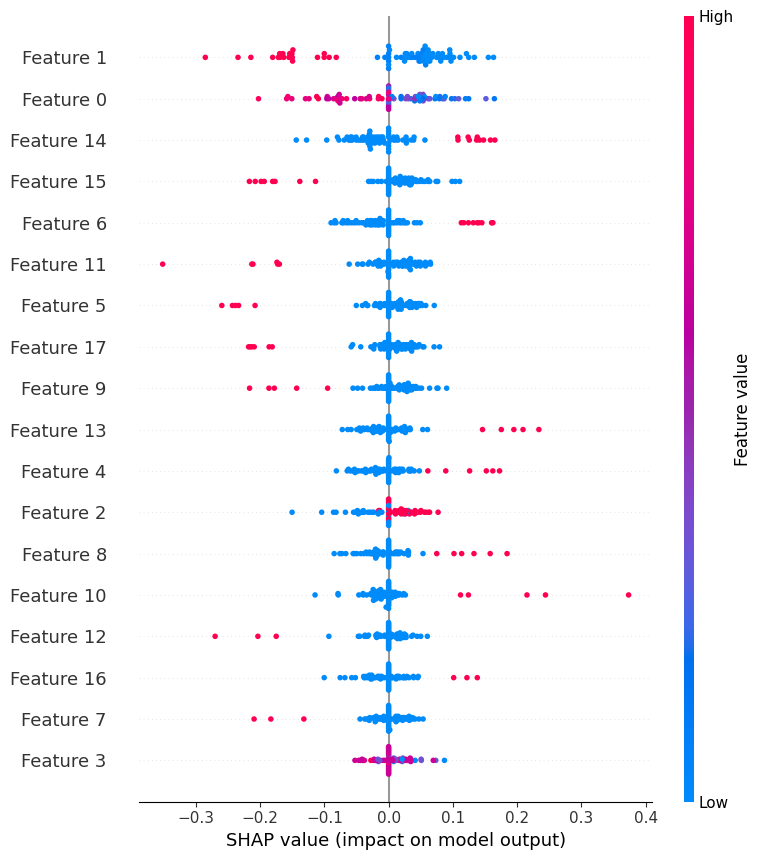

In [50]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(myknn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [53]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], myknn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.3907976749108559
Prediction_local [0.99895732]
Right: 0.9999999999999998


In [1]:
# exp = limeExplainer.explain_instance(np.array(X_test)[6], myknn.predict_proba, num_features=34)
# exp.show_in_notebook(show_table=True)

NameError: name 'limeExplainer' is not defined

<span style="font-weight:500;font-size:24px">
  PNN
</span><br/>


PNN
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
0.8285714285714285
[[0.48376826 0.51623174]
 [0.29466293 0.70533707]
 [0.31057996 0.68942004]
 [0.34193894 0.65806106]
 [0.27395885 0.72604115]
 [0.24417009 0.75582991]
 [0.34466537 0.65533463]
 [0.27479405 0.72520595]
 [0.24458363 0.75541637]
 [0.35405456 0.64594544]
 [0.50089068 0.49910932]
 [0.42962262 0.57037738]
 [0.53076857 0.46923143]
 [0.35492264 0.64507736]
 [0.04547651 0.95452349]
 [0.40390961 0.59609039]
 [0.26845287 0.73154713]
 [0.44280684 0.55719316]
 [0.1996366  0.8003634 ]
 [0.55607149 0.44392851]
 [0.24122821 0.75877179]
 [0.55073452 0.44926548]
 [0.55195168 0.44804832]
 [0.2638172  0.7361828 ]
 [0.2727649  0.7272351 ]
 [0.04547651 0.95452349]
 [0.65241399 0.34758601]
 [0.69934938 0.30065062]
 [0.5605361  0.4394639 ]
 [0.30100907 0.69899093]
 [0.31020862

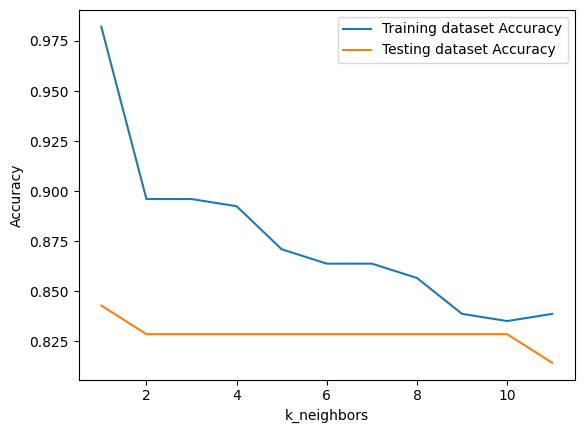

In [60]:
from PNN import PNN

# PNN
pnn = PNN(k_neighbors=k)
pnn.fit(X_train, y_train)
print()
print("PNN")
print(pnn.predict(X_test))
print(pnn.score(X_test, y_test))
print(pnn.predict_proba(np.array(X_test)))
pnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [33:40<00:00, 25.26s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


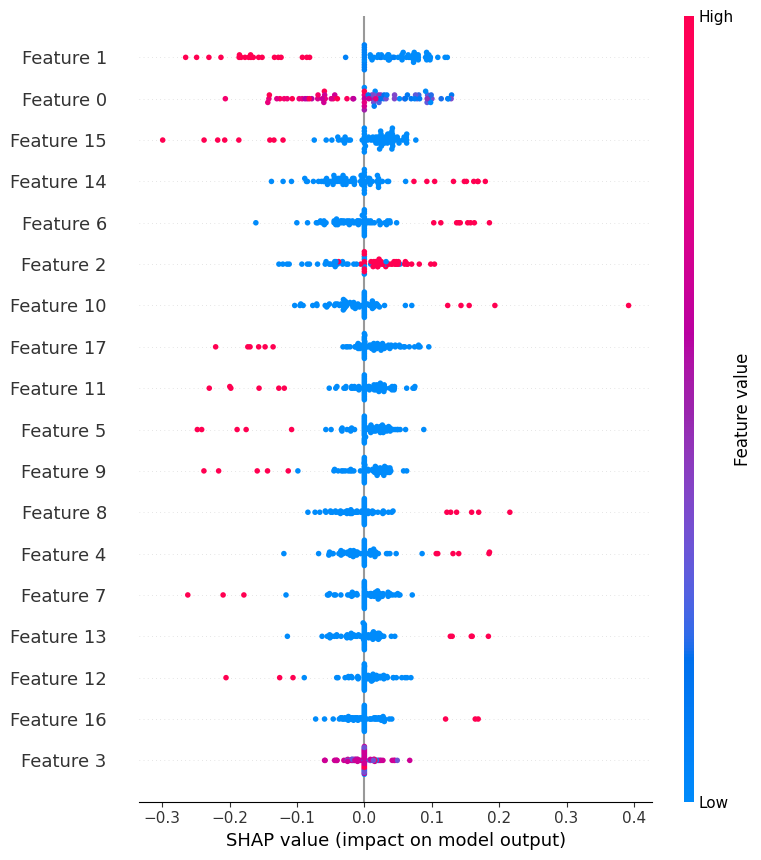

In [55]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(pnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [57]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], pnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.41485679257521113
Prediction_local [0.64434603]
Right: 0.8219358204368197


<span style="font-weight:500;font-size:24px">
  LMPNN
</span><br/>


LMPNN
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
0.8857142857142857
[[0.37584389 0.62415611]
 [0.46400722 0.53599278]
 [0.38800183 0.61199817]
 [0.36342396 0.63657604]
 [0.23246425 0.76753575]
 [0.38835945 0.61164055]
 [0.4569436  0.5430564 ]
 [0.25746942 0.74253058]
 [0.15485877 0.84514123]
 [0.13959392 0.86040608]
 [0.54078923 0.45921077]
 [0.45549594 0.54450406]
 [0.90933102 0.09066898]
 [0.37443467 0.62556533]
 [0.00895774 0.99104226]
 [0.49403879 0.50596121]
 [0.17993341 0.82006659]
 [0.51367276 0.48632724]
 [0.13704053 0.86295947]
 [0.65186866 0.34813134]
 [0.34439863 0.65560137]
 [0.62775537 0.37224463]
 [0.62551629 0.37448371]
 [0.36176626 0.63823374]
 [0.11172121 0.88827879]
 [0.00895774 0.99104226]
 [0.71129911 0.28870089]
 [0.70115297 0.29884703]
 [0.53629574 0.46370426]
 [0.33067312 0.66932688]
 [0.130009

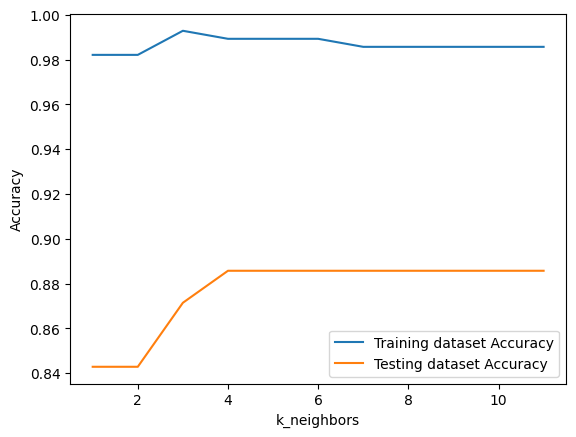

In [61]:
from LMPNN import LMPNN

# LMPNN
lmpnn = LMPNN(k_neighbors=k)
lmpnn.fit(X_train, y_train)
print()
print("LMPNN")
print(lmpnn.predict(X_test))
print(lmpnn.score(X_test, y_test))
print(lmpnn.predict_proba(np.array(X_test)))
lmpnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [31:33<00:00, 23.67s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


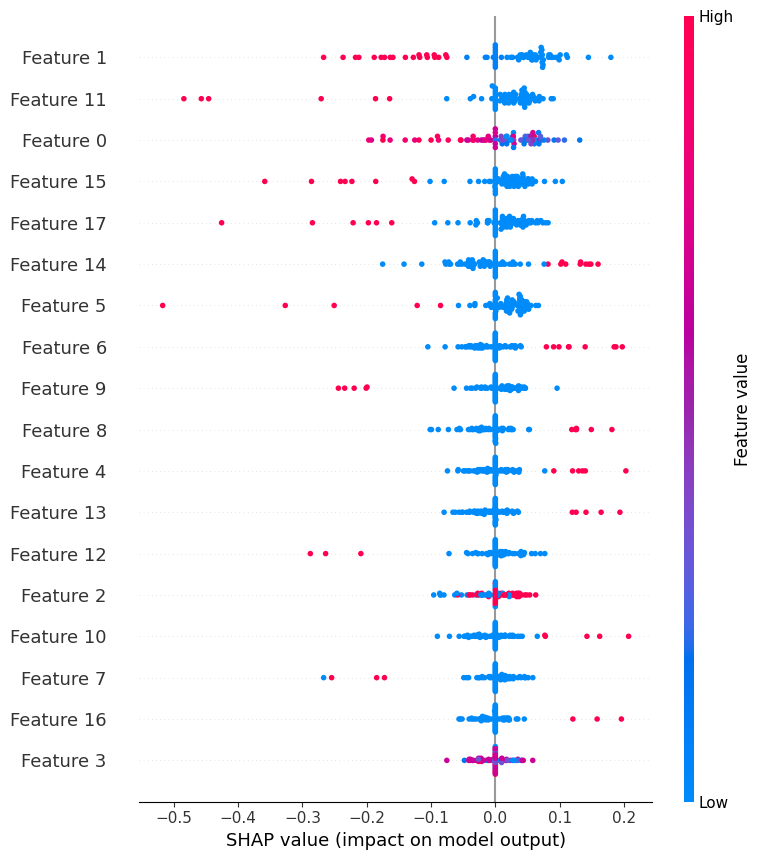

In [59]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(lmpnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [60]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], lmpnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.3034048611173721
Prediction_local [0.7009623]
Right: 0.9641827129931262


<span style="font-weight:500;font-size:24px">
  MVMCNN
</span><br/>

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp


MVMCNN
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1.
 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1.
 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
0.8857142857142857
[[0.37584389 0.62415611]
 [0.39135426 0.60864574]
 [0.38800183 0.61199817]
 [0.36342396 0.63657604]
 [0.23246425 0.76753575]
 [0.36127568 0.63872432]
 [0.39561489 0.60438511]
 [0.25746942 0.74253058]
 [0.15485877 0.84514123]
 [0.13959392 0.86040608]
 [0.54018696 0.45981304]
 [0.45549594 0.54450406]
 [0.91168805 0.08831195]
 [0.37443467 0.62556533]
 [0.00895774 0.99104226]
 [0.49403879 0.50596121]
 [0.17993341 0.82006659]
 [0.5097099  0.4902901 ]
 [0.13704053 0.86295947]
 [0.65191227 0.34808773]
 [0.33082098 0.66917902]
 [0.63115435 0.36884565]
 [0.62955541 0.37044459]
 [0.34148639 0.65851361]
 [0.14620908 0.85379092]
 [0.00895774 0.99104226]
 [0.71129911 0.28870089]
 [0.70115297 0.29884703]
 [0.53724843 0.46275157]
 [0.33067312 0.66932688]
 [0.13000

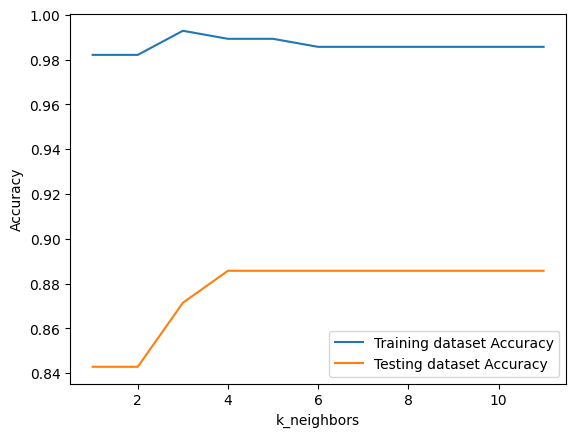

In [62]:
from MVMCNN import MVMCNN

# MVMCNN
mvmcnn = MVMCNN(k_neighbors=k)
mvmcnn.fit(X_train, y_train)
print()
print("MVMCNN")
print(mvmcnn.predict(X_test))
print(mvmcnn.score(X_test, y_test))
print(mvmcnn.predict_proba(np.array(X_test)))
mvmcnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [48:07<00:00, 36.10s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


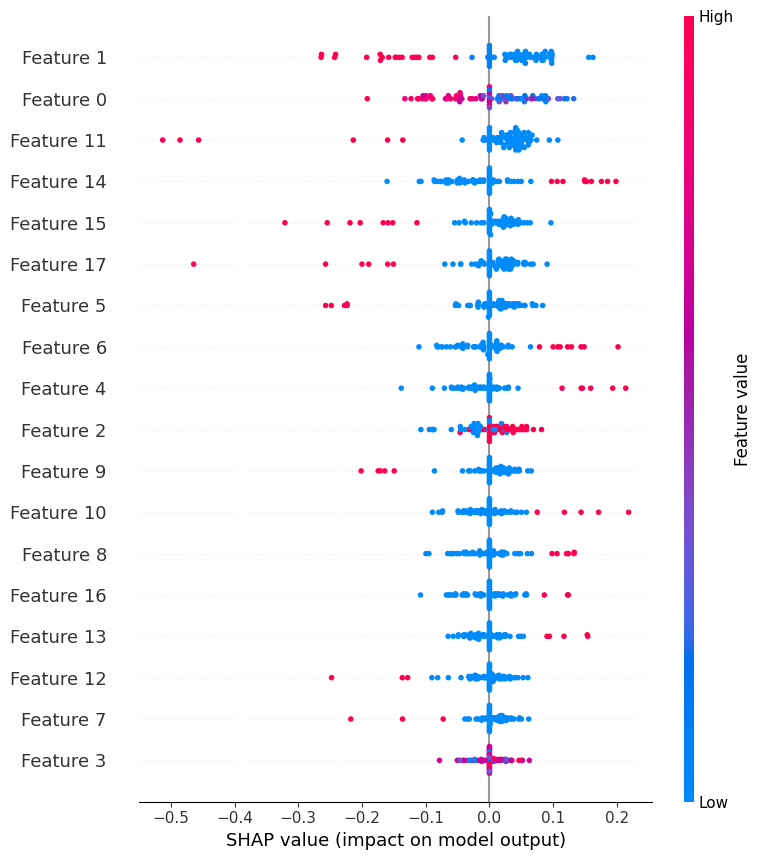

In [62]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(mvmcnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [63]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], mvmcnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.3592108500341702
Prediction_local [0.71229376]
Right: 0.9652207421891446


<span style="font-weight:700;font-size:36px">
  Feature Detail
</span>

In [22]:
featureTitle = 'ip.src'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  1
Feature Name:  ip.src
Total Unique Value:  14 
Value Type:  object
Description: 

Total each value:
192.168.1.1     10800
192.168.4.1     10800
192.168.7.1     10800
192.168.17.1    10800
192.168.14.1    10800
192.168.11.1    10800
192.168.20.1    10800
192.168.2.1     10800
192.168.5.1     10800
192.168.8.1     10800
192.168.16.1    10800
192.168.13.1    10800
192.168.10.1    10800
192.168.19.1    10800
Name: ip.src, dtype: int64


In [23]:
featureTitle = 'ip.dst'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  2
Feature Name:  ip.dst
Total Unique Value:  1 (single-value)
Value Type:  object
Description: 

Total each value:
192.168.23.2    151200
Name: ip.dst, dtype: int64


In [24]:
featureTitle = 'tcp.srcport'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  3
Feature Name:  tcp.srcport
Total Unique Value:  31009 
Value Type:  int64
Description: 

Total each value:
4986     12
10824    12
9574     12
2868     12
9684     12
         ..
17667     1
17670     1
17671     1
17673     1
16522     1
Name: tcp.srcport, Length: 31009, dtype: int64


In [25]:
featureTitle = 'tcp.dstport'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  4
Feature Name:  tcp.dstport
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
8000    151200
Name: tcp.dstport, dtype: int64


In [26]:
featureTitle = 'ip.proto'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  5
Feature Name:  ip.proto
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
6    151200
Name: ip.proto, dtype: int64


In [27]:
featureTitle = 'frame.len'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  6
Feature Name:  frame.len
Total Unique Value:  4 
Value Type:  int64
Description: 

Total each value:
54     75600
66     37800
222    34001
223     3799
Name: frame.len, dtype: int64


In [28]:
featureTitle = 'tcp.flags.syn'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  7
Feature Name:  tcp.flags.syn
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: tcp.flags.syn, dtype: int64


In [29]:
featureTitle = 'tcp.flags.reset'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  8
Feature Name:  tcp.flags.reset
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: tcp.flags.reset, dtype: int64


In [30]:
featureTitle = 'tcp.flags.push'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  9
Feature Name:  tcp.flags.push
Total Unique Value:  2 
Value Type:  int64
Description: 

Total each value:
1    75600
0    75600
Name: tcp.flags.push, dtype: int64


In [31]:
featureTitle = 'tcp.flags.ack'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  10
Feature Name:  tcp.flags.ack
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.flags.ack, dtype: int64


In [32]:
featureTitle = 'ip.flags.mf'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  11
Feature Name:  ip.flags.mf
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: ip.flags.mf, dtype: int64


In [33]:
featureTitle = 'ip.flags.df'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  12
Feature Name:  ip.flags.df
Total Unique Value:  2 
Value Type:  int64
Description: 

Total each value:
0    75600
1    75600
Name: ip.flags.df, dtype: int64


In [34]:
featureTitle = 'ip.flags.rb'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  13
Feature Name:  ip.flags.rb
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: ip.flags.rb, dtype: int64


In [35]:
featureTitle = 'tcp.seq'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  14
Feature Name:  tcp.seq
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.seq, dtype: int64


In [36]:
featureTitle = 'tcp.ack'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  15
Feature Name:  tcp.ack
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.ack, dtype: int64


In [37]:
featureTitle = 'frame.time'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  16
Feature Name:  frame.time
Total Unique Value:  151200 (all-unique-value)
Value Type:  object
Description: 

Total each value:
 16-Jun 2020 20:18:15.071112000 Mountain Daylight Time    1
 16-Jun 2020 22:05:19.560129000 Mountain Daylight Time    1
 16-Jun 2020 22:05:19.559918000 Mountain Daylight Time    1
 16-Jun 2020 22:05:19.559936000 Mountain Daylight Time    1
 16-Jun 2020 22:05:19.559951000 Mountain Daylight Time    1
                                                         ..
 16-Jun 2020 20:21:44.728999000 Mountain Daylight Time    1
 16-Jun 2020 20:21:44.741244000 Mountain Daylight Time    1
 16-Jun 2020 20:21:44.759671000 Mountain Daylight Time    1
 16-Jun 2020 20:21:44.771122000 Mountain Daylight Time    1
 16-Jun 2020 22:10:46.984798000 Mountain Daylight Time    1
Name: frame.time, Length: 151200, dtype: int64


In [38]:
featureTitle = 'Packets'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  17
Feature Name:  Packets
Total Unique Value:  19 
Value Type:  int64
Description: 

Total each value:
10    92229
8     20818
6     16446
12     8017
4      7280
14     2229
2      1504
9       643
7       635
16      476
11      336
5       304
13      123
3        70
18       38
15       34
17        8
1         8
20        2
Name: Packets, dtype: int64


In [39]:
featureTitle = 'Bytes'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  18
Feature Name:  Bytes
Total Unique Value:  29 
Value Type:  int64
Description: 

Total each value:
432     20818
540     16629
324     16446
648      8017
1151     7664
1134     7625
1123     7620
1140     7595
1146     7595
1229     7568
1175     7536
1144     7472
1168     7466
1170     7459
216      7280
756      2229
108      1504
486       643
378       635
864       476
594       336
270       304
702       123
162        70
972        38
810        34
918         8
54          8
1080        2
Name: Bytes, dtype: int64


In [40]:
featureTitle = 'Tx Packets'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  19
Feature Name:  Tx Packets
Total Unique Value:  10 
Value Type:  int64
Description: 

Total each value:
6     83961
4     21452
5     17275
3     16741
2      7346
7      2355
1      1512
8       510
9        46
10        2
Name: Tx Packets, dtype: int64


In [41]:
featureTitle = 'Tx Bytes'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  20
Feature Name:  Tx Bytes
Total Unique Value:  12 
Value Type:  int64
Description: 

Total each value:
560    68032
216    21452
270    17275
162    16741
324     8361
561     7568
108     7346
378     2355
54      1512
432      510
486       46
540        2
Name: Tx Bytes, dtype: int64


In [42]:
featureTitle = 'Rx Packets'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  21
Feature Name:  Rx Packets
Total Unique Value:  11 
Value Type:  int64
Description: 

Total each value:
4     97058
3     17082
5     16957
6      8137
2      7593
7      2263
1      1578
8       484
9        38
0         8
10        2
Name: Rx Packets, dtype: int64


In [43]:
featureTitle = 'Rx Bytes'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  22
Feature Name:  Rx Bytes
Total Unique Value:  21 
Value Type:  int64
Description: 

Total each value:
216    21458
162    17082
270    16957
324     8137
591     7664
574     7625
563     7620
586     7595
580     7595
108     7593
668     7568
615     7536
584     7472
608     7466
610     7459
378     2263
54      1578
432      484
486       38
0          8
540        2
Name: Rx Bytes, dtype: int64


In [44]:
featureTitle = 'Label'
showFeatureDetail(APADDoSDataset, featureTitle)

No. Feature:  23
Feature Name:  Label
Total Unique Value:  3 
Value Type:  object
Description: 

Total each value:
Benign          75600
DDoS-PSH-ACK    37800
DDoS-ACK        37800
Name: Label, dtype: int64
